# Visualising CDSS data
Due to the multiple dimensions of the CDSS data it needs to be reduced to two dimensions. This can be done with several methods like PCA, t-SNE, UMAP and FAMD. Each require preprocessing and yield different results. In this notebook we test all dimensionality reduction methods and determine the best for the CDSS data which is the one that visually reveals the most differentiating clusters.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sb

In [2]:
# import cleaned and prepared data of consultations in RW
data = pd.read_pickle("data/rw-cleaned-prepared-dynamic-data-phase1.pickle")

# get features and diagnoses used for clustering
features = pd.read_pickle("data/rwanda/features.pickle")
diagnoses = pd.read_pickle("data/rwanda/diagnoses.pickle")

# FAMD
FAMD is the most common dimensionality reduction method for mixed-typed data which makes it our first choice and its result is the baseline for other dimensionality reduction methods. Factor analysis of mixed data (FAMD) is a principal component method that combines principal component analysis (PCA) for continuous variables and multiple correspondence analysis (MCA) for categorical variables.

[source](https://www.taylorfrancis.com/books/mono/10.1201/b17700/multiple-factor-analysis-example-using-j%C3%A9r%C3%B4me-pag%C3%A8s)

In [3]:
pip install prince

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


## Preprocessing
- impute missing values of numerical features with mean if they are continues and with median if they are binary/categorical
- stringify missing values of non-numerical features making missingness an additional category of these features which are all binary or categorical

In [4]:
famd_preprocessed_features = features.copy()
for col in famd_preprocessed_features.columns:
    if "float" in str(famd_preprocessed_features[col].dtype): # if continues feature
        # impute with mean
        famd_preprocessed_features[col] = famd_preprocessed_features[col].fillna(np.mean(famd_preprocessed_features[col]))
        print(col, "'s missing values were imputted using mean")
    elif "int" in str(famd_preprocessed_features[col].dtype): # if discrete feature
        # impute with meddian
        famd_preprocessed_features[col] = famd_preprocessed_features[col].fillna(np.median(famd_preprocessed_features[col]))
        print(col, "'s missing values were imputted using median")
    else: # if binary or categorical feature 
        # stringify NAN values
        famd_preprocessed_features[col] = famd_preprocessed_features[col].fillna("missing")
        print(col, "'s missing values were stringified and thus added as an extra category")
print("Number of missing values in features after preprocessing:", famd_preprocessed_features.isna().sum().sum())

patient_age 's missing values were imputted using mean
patient_gender 's missing values were stringified and thus added as an extra category
PE212 - Respiratory rate (breaths/min) - 8469 's missing values were imputted using mean
S39 - Cough - 7817 's missing values were stringified and thus added as an extra category
PE18 - Chest indrawing - 7811 's missing values were stringified and thus added as an extra category
S180 - How is the infant feeding currently? - 7516 's missing values were stringified and thus added as an extra category
S46 - Convulsions in present illness - 8355 's missing values were stringified and thus added as an extra category
BC - Axillary temperature - 7823 categorical 's missing values were stringified and thus added as an extra category
PE125 - Observation of movement - 8388 's missing values were stringified and thus added as an extra category
S96 - Unable to drink or breastfeed - 7871 's missing values were stringified and thus added as an extra category
S1

## Reduce dimensions and visualise features

In [5]:
import prince

famd = prince.FAMD(
    n_components=2,
    n_iter=3,
    copy=True,
    check_input=True,
    random_state=1,
    engine="sklearn",
    handle_unknown="error"  # same parameter as sklearn.preprocessing.OneHotEncoder
)
famd_model = famd.fit(famd_preprocessed_features)
famd_data = famd_model.transform(famd_preprocessed_features)

In [6]:
famd_model.eigenvalues_summary

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,204.137,15.74%,15.74%
1,70.383,5.43%,21.17%


In [33]:
fig = px.scatter(x=famd_data[0], y= famd_data[1], labels={"x":"Dimension 1", "y":"Dimension 2"}, title="Features after FAMD")
fig.show()

# UMAP

In [8]:
pip install umap-learn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [37]:
import umap
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

## Preprocessing
- impute missing values of numerical features with mean if they are continues and with median if they are binary/categorical
- stringify missing values of non-numerical features making missingness an additional category of these features which are all binary or categorical
- one-hot encode non-numerical features

In [10]:
umap_preprocessed_features = famd_preprocessed_features.copy() # copy to save preprocessing steps already on before

# one hot encode all non-numerical features
non_numerical_features = [umap_preprocessed_features.dtypes.index[i] for i, e in enumerate(umap_preprocessed_features.dtypes) if e != "float64"]
for feature in non_numerical_features:
    encoded_feature = pd.get_dummies(umap_preprocessed_features[feature], prefix=feature+"_")
    for new_feature in encoded_feature.columns:
        umap_preprocessed_features[new_feature] = encoded_feature[new_feature]

# drop original columns
umap_preprocessed_features = umap_preprocessed_features.drop(non_numerical_features, axis=1)

C:\Users\sidla\AppData\Local\Temp\ipykernel_15440\567528146.py:8: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\sidla\AppData\Local\Temp\ipykernel_15440\567528146.py:8: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\sidla\AppData\Local\Temp\ipykernel_15440\567528146.py:8: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fra

## Reduce dimensions and visualise features

In [12]:
# perform UMAP
umap = umap.UMAP(n_neighbors=50, min_dist=0.0, random_state=2)
model_umap = umap.fit(umap_preprocessed_features)
data_umap = model_umap.transform(umap_preprocessed_features)

In [32]:
fig = px.scatter(x=data_umap[:,0], y= data_umap[:,1], labels={"x":"Dimension 1", "y":"Dimension 2"}, title="Features after UMAP")
fig.show()

# UMAP with individual embedding for numerical and categorical/binary features

In [40]:
"""""from sklearn.preprocessing import PowerTransformer

# preprocessing numerical: make data more Gaussian like with Yeo-Johnson transformation
numerical = famd_preprocessed_features.select_dtypes(exclude='object')
for c in numerical.columns:
    pt = PowerTransformer()
    numerical.loc[:, c] = pt.fit_transform(np.array(numerical[c]).reshape(-1, 1))
    
# preprocessing categorical: one-hot encoding
categorical = famd_preprocessed_features.select_dtypes(include='object')
categorical = pd.get_dummies(categorical)

# percentage of columns which are categorical is used as weight parameter in embeddings later
categorical_weight = len(famd_preprocessed_features.select_dtypes(include='object').columns) / famd_preprocessed_features.shape[1]

# embedding numerical & categorical
fit1 = umap.UMAP(metric='l2').fit(numerical)
fit2 = umap.UMAP(metric='dice').fit(categorical)

# augmenting the numerical embedding with categorical
intersection = umap.umap_.general_simplicial_set_intersection(fit1.graph_, fit2.graph_, weight=categorical_weight)
intersection = umap.umap_.reset_local_connectivity(intersection)
embedding = umap.umap_.simplicial_set_embedding(fit1._raw_data, intersection, fit1.n_components, 
                                                fit1._initial_alpha, fit1._a, fit1._b, 
                                                fit1.repulsion_strength, fit1.negative_sample_rate, 
                                                200, 'random', np.random, fit1.metric, 
                                                fit1._metric_kwds, False)

plt.figure(figsize=(20, 10))
plt.scatter(*embedding.T, s=2, cmap='Spectral', alpha=1.0)
plt.show()"""""

'""from sklearn.preprocessing import PowerTransformer\n\n# preprocessing numerical: make data more Gaussian like with Yeo-Johnson transformation\nnumerical = famd_preprocessed_features.select_dtypes(exclude=\'object\')\nfor c in numerical.columns:\n    pt = PowerTransformer()\n    numerical.loc[:, c] = pt.fit_transform(np.array(numerical[c]).reshape(-1, 1))\n    \n# preprocessing categorical: one-hot encoding\ncategorical = famd_preprocessed_features.select_dtypes(include=\'object\')\ncategorical = pd.get_dummies(categorical)\n\n# percentage of columns which are categorical is used as weight parameter in embeddings later\ncategorical_weight = len(famd_preprocessed_features.select_dtypes(include=\'object\').columns) / famd_preprocessed_features.shape[1]\n\n# embedding numerical & categorical\nfit1 = umap.UMAP(metric=\'l2\').fit(numerical)\nfit2 = umap.UMAP(metric=\'dice\').fit(categorical)\n\n# augmenting the numerical embedding with categorical\nintersection = umap.umap_.general_simpli

# PCA and T-SNE

## Preprocessing
Same as for UMAP
- impute missing values of numerical features with mean if they are continues and with median if they are binary/categorical
- stringify missing values of non-numerical features making missingness an additional category of these features which are all binary or categorical
- one-hot encode non-numerical features

## Reduce dimensions and visualise features

In [16]:
# perform pca
pca = PCA(n_components=2, random_state=3)
model_pca = pca.fit(umap_preprocessed_features)
data_pca = model_pca.transform(umap_preprocessed_features)

In [17]:
# perform t-SNE
tsne = TSNE(n_components=2, random_state=4)
data_tsne = tsne.fit_transform(umap_preprocessed_features)
print("KL divergence:", tsne.kl_divergence_)

KL divergence: 0.6342114210128784


In [18]:
# visualis PCA
fig = px.scatter(x=data_pca[:,0], y= data_pca[:,1], labels={"x":"Dimension 1", "y":"Dimension 2"}, title="Features after PCA")
fig.show()

In [19]:
# visualis t-SNE
fig = px.scatter(x=data_tsne[:,0], y= data_tsne[:,1], labels={"x":"Dimension 1", "y":"Dimension 2"}, title="Features after t-SNE")
fig.show()

# Evaluate dimensionality reduction method through K-Means and silhouette score

In [22]:
!pip install yellowbrick


[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [27]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_score
def evaluate_dimensionality_reduction(dim1, dim2, method):

    # prepare data
    k_means_preprocessed_data = pd.DataFrame({"Dimension 1": dim1, "Dimension 2": dim2})

    # Finding the optimal number of clusters using the Elbow method with yellowbrick
    model = KMeans(n_init=10)
    visualizer = KElbowVisualizer(model, k=(1,30))
    visualizer.fit(k_means_preprocessed_data)
    n_clusters = visualizer.elbow_value_ # optimal number of clusters
    fig_elbow_method = visualizer.show()

    # Performing clustering with the optimal number of clusters
    kmeans = KMeans(n_clusters=n_clusters, n_init=10, random_state=2).fit(k_means_preprocessed_data)

    # Adding the column 'cluster' to the dataframe
    k_means_preprocessed_data["Cluster"] = kmeans.labels_

    # evaluate clustering through silhoutte score
    score = silhouette_score(k_means_preprocessed_data[["Dimension 1", "Dimension 2"]], k_means_preprocessed_data["Cluster"], metric='euclidean')

    # visualise clusters
    fig_clusters = px.scatter(
        k_means_preprocessed_data, 
        x="Dimension 1", 
        y="Dimension 2", 
        color="Cluster", 
        title=f"Clustering with silhouette score {score} after dimensionality reduction through {method}"
    )
    return score, fig_elbow_method, fig_clusters


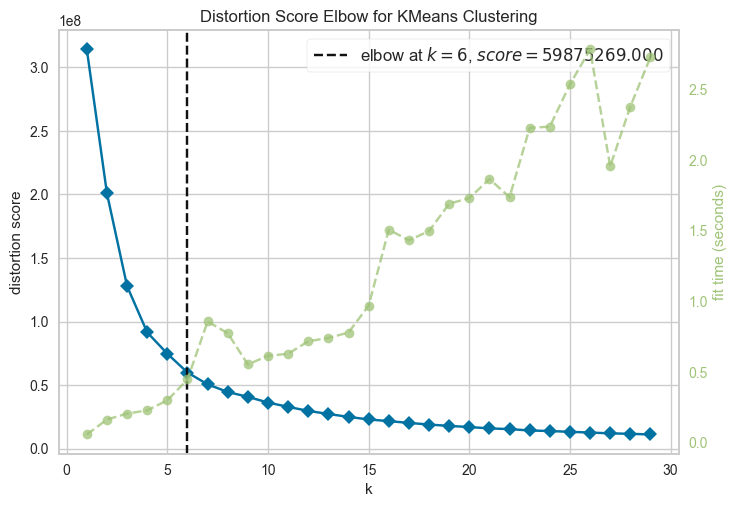

In [28]:
# evaluate t-SNE
score_tsne, fig_elbow_method_tsne, fig_clusters_tsne = evaluate_dimensionality_reduction(data_tsne[:,0], data_tsne[:,1], "t-SNE")

In [29]:
fig_clusters_tsne.show()

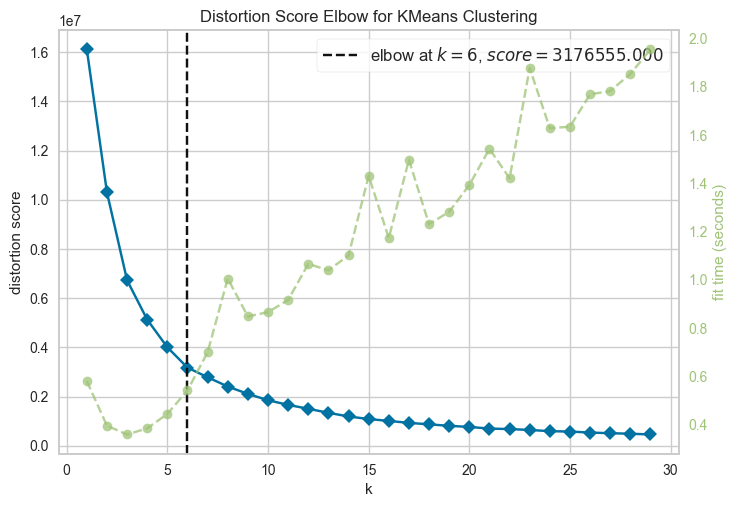

In [30]:
# evaluate UMAP
score_umap, fig_elbow_method_umap, fig_clusters_umap = evaluate_dimensionality_reduction(data_umap[:,0], data_umap[:,1], "UMAP")

In [31]:
fig_clusters_umap.show()

# Conclusion
- FAMD is bad probably because it reduces numerical features based on PCA which is does not work well with the given data. One reason might be that PCA assumes linear dependency between features which is unlikely due to mixed-typed features. Only 2 features are numerical and need to be linear dependent.
- UMAP and t-SNE visually reveal most distinguishable clusters. However, running K-Means with elbow method K on the dimensionally reduced data leads in both cases to silhouette scores below 0.5 which is considered to be bad results. For `Future work`, one should try to improve the dimensionality reduction e.g. with better preprocessing. One-hot encoding surely might be a reason for the bad outcome (read more papers about this).
- UMAP got more hyperparameters andd thus more potential to get even better visualisations of clusters in the future.
- All in all, UMAP is the best method and will be used for further work in this study.

In [41]:
# store best dimensionality reduction method
pd.DataFrame({"Dimension 1": data_umap[:,0], "Dimension 2": data_umap[:,1]}).to_pickle("data/rwanda/features_after_dimensionality_reduction.pickle")